# Machine Learning Classification Methods

#### Ewa Dobrowolska, January 2023 

The goal of this project is to perform and compare several machine learning classification algorithms on the **telescope** dataset (source: [kaggle](https://www.kaggle.com/datasets/brsdincer/telescope-spectrum-gamma-or-hadron)). The dataset consists of data regarding high energy gamma particles. Variables:

| Variable | Description | Unit |
| :- | :- | :- |
| fLength | major axis of ellipse | mm |
| fWidth | minor axis of ellipse | mm |
| fSize | 10-log of sum of content of all pixels | phot |
| fConc | ratio of sum of two highest pixels over fSize | ratio |
| fConc1 | ratio of highest pixel over fSize | ratio |
| fAsym | distance from highest pixel to center, projected onto major axis| mm |
| fM3Long | 3rd root of third moment along major axis | mm |
| fM3Trans | 3rd root of third moment along minor axis | mm |
| fAlpha | angle of major axis with vector to origin | deg |
| fDist | distance from origin to center of ellipse | mm |
| class | gamma (signal), hadron (background) | -
  
The dependent variable is `class` and has two levels: **g** for Gamma spectrum and **h** for Hadron spectrum.

### Data description & preparation 

Let's load neccessary functions and packages:

In [1]:
import pandas as pd
import os
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, RocCurveDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline, Pipeline 
from sklearn.svm import SVC  
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from scikeras.wrappers import KerasClassifier
from keras import Sequential
from keras.layers import Dense
import time
import warnings 
warnings.filterwarnings('ignore')

#os.chdir("C:/Users/ewado/OneDrive/Dokumenty/Studia/ML/projekt")

Let's read the datset and take a look at its basic description:

In [2]:
data = pd.read_csv("telescope.csv")
data.shape # 19 020 observations of 11 variables

(19020, 11)

Let's view the first 5 observations and check whether there is any missing data:

In [3]:
data.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


In [4]:
pd.isnull(data).sum() # no missing data

fLength     0
fWidth      0
fSize       0
fConc       0
fConc1      0
fAsym       0
fM3Long     0
fM3Trans    0
fAlpha      0
fDist       0
class       0
dtype: int64

Let's check the types of the variables:

In [5]:
data.dtypes

fLength     float64
fWidth      float64
fSize       float64
fConc       float64
fConc1      float64
fAsym       float64
fM3Long     float64
fM3Trans    float64
fAlpha      float64
fDist       float64
class        object
dtype: object

The dataset's description provided by the authors suggests that it is much more important to detect Gaamma particles than Hadron particles. Therefore, although Gamma particles are more frequent ones, the variable `class` is decoded into 0 for Hadron spectrum and 1 for Gamma spectrum:

In [6]:
data['class'] = data["class"].map(lambda x: 1 if x == "g" else 0)
data['class'] = data['class'].astype('category')

data.dtypes #now it's ok

fLength      float64
fWidth       float64
fSize        float64
fConc        float64
fConc1       float64
fAsym        float64
fM3Long      float64
fM3Trans     float64
fAlpha       float64
fDist        float64
class       category
dtype: object

Let's take a closer look at the dependent variable, `class`:

In [7]:
data["class"].value_counts(normalize=True)

1    0.64837
0    0.35163
Name: class, dtype: float64

In [8]:
data["class"].value_counts()

1    12332
0     6688
Name: class, dtype: int64

As we can see, it is imbalanced. We will need to take this into account when buiding the models.

In [9]:
duplicated = data.duplicated(subset = None, keep = 'first')
n_duplicated = duplicated[duplicated == True].shape[0]
n_duplicated 

115

In [10]:
data = data.drop_duplicates(subset = None, keep = 'first')

Some data was duplicated so we had to remove it (to prevent the data into leaking into the test set).

### Explanatory Data Analysis & visualisation 

Let's visualize the dependent variable:

<AxesSubplot:xlabel='class', ylabel='count'>

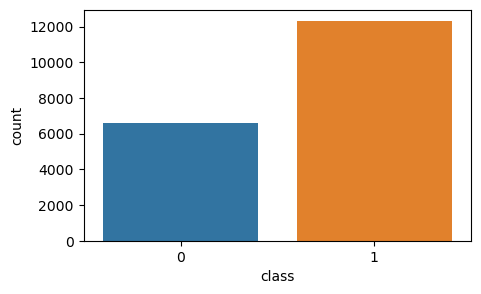

In [11]:
plt.figure(figsize=[5,3])
sns.countplot(data["class"])

Let's see the dependencies between the variables:

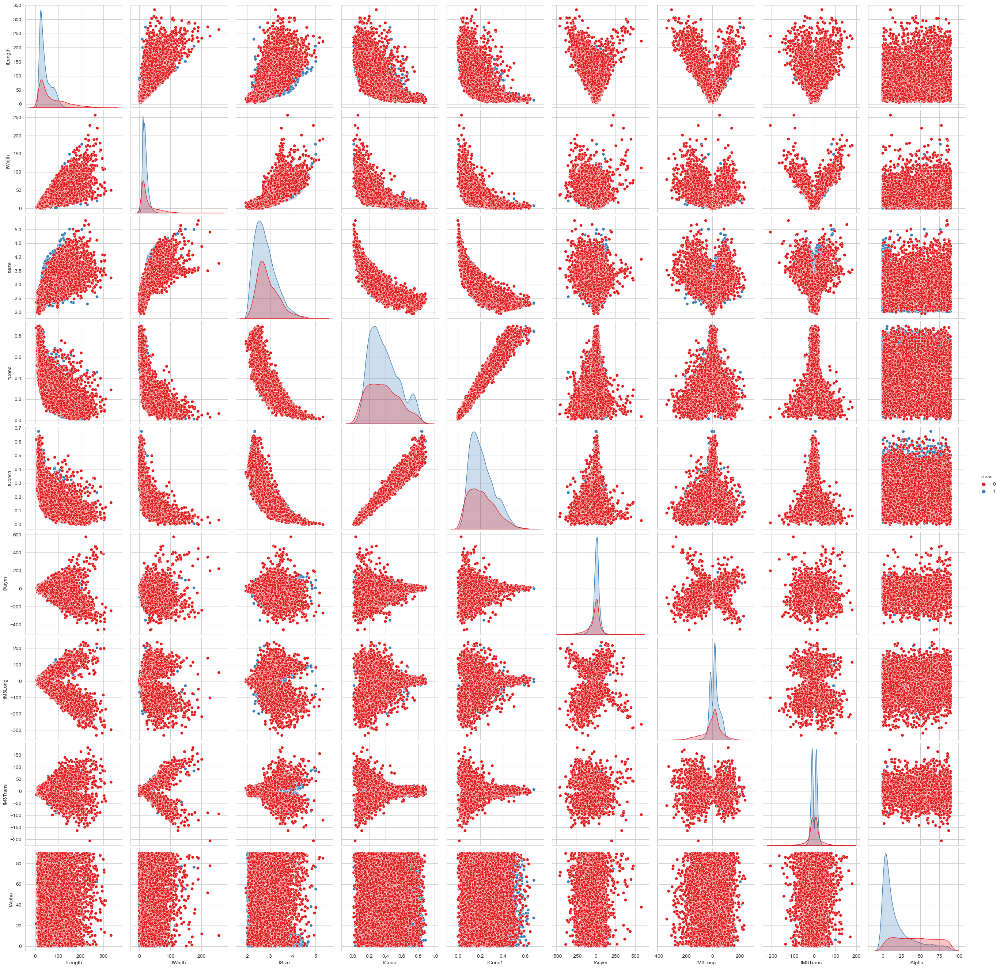

In [12]:
spectrum_data = data.groupby("class").mean().round(2)
spectrum_data

sns.set_style("whitegrid")
sns.pairplot(
    data[["fLength", "fWidth", "fSize", "fConc", "fConc1", "fAsym", "fM3Long", "fM3Trans", "fAlpha", "class"]],
    hue = "class",
    height = 3,
    palette = "Set1")

It is clear that the classes differ in a few ways: Classes with the Gamma spectrum on average have bigger values of variables `fAsym`, `fM3Long`, and lower values of variables `fLength`, `fWidth`, `fM3Trans`, `fAlpha`. We'll see if the models confirm this observation.  

Take a look at the distributions of numeric variables:

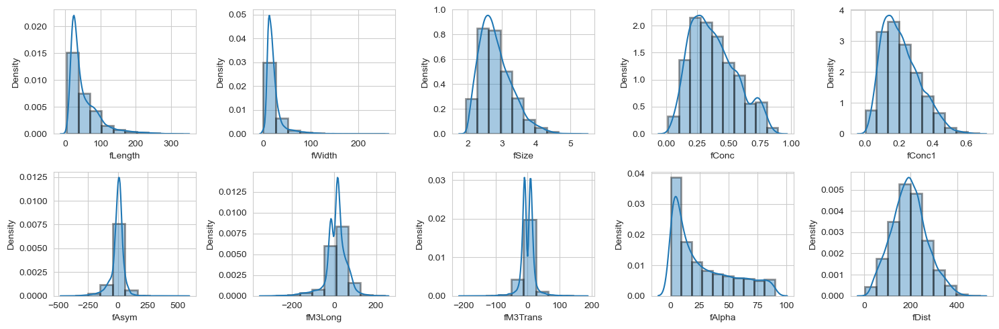

In [13]:
num_f = ["fLength", "fWidth", "fSize", "fConc", "fConc1", "fAsym", "fM3Long", "fM3Trans", "fAlpha", "fDist"]

plt.figure(figsize=[15,5])
for i in range(len(num_f)):
    plt.subplot(2,5,i+1)
    sns.distplot(data[num_f[i]],hist_kws=dict(edgecolor="black", linewidth=2), bins=10)
    plt.tight_layout()

plt.show()

...and the boxplots for categorical variables:

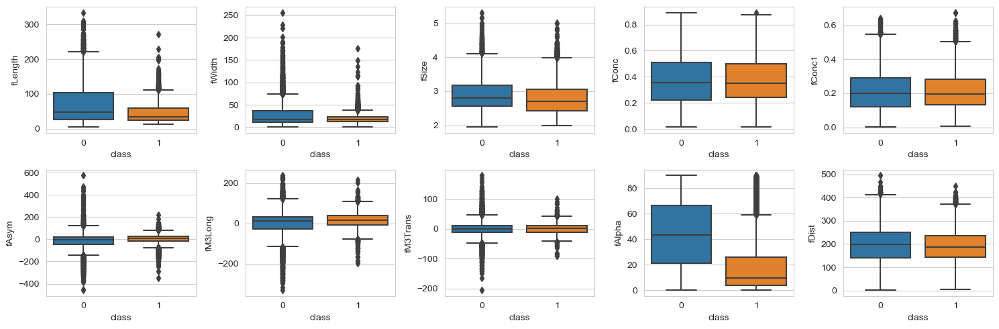

In [14]:
plt.figure(figsize=[15,5])
for i in range(len(num_f)):
    plt.subplot(2,5,i+1)
    #data.boxplot(num_f[i])
    sns.boxplot(x='class',y=num_f[i],data=data)
plt.tight_layout()
plt.show()

The boxplots suggest that the only variable differenciating between Gamma and Hadron particle is `fAlpha`. 

### Data preparation, Variable selection

Split the data into train and test sets:

In [15]:
X=data.drop("class", axis = 1) 
y=data["class"]

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=21)

Define a function we will use to evaluate models:

In [16]:
def evaluate_model(y_train, y_pred_train, y_test, y_pred_test):
    accuracy_train = accuracy_score(y_train, y_pred_train)
    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_train = precision_score(y_train, y_pred_train)
    precision_test = precision_score(y_test, y_pred_test)
    recall_train = recall_score(y_train, y_pred_train)
    recall_test = recall_score(y_test, y_pred_test)
    f1_train = f1_score(y_train, y_pred_train)
    f1_test = f1_score(y_test, y_pred_test)

    eval_df = pd.DataFrame({"Metric": ["Accuracy", "Precision", "Recall", "F1"], 
                        "Train": [accuracy_train, precision_train, recall_train, f1_train],
                        "Test": [accuracy_test, precision_test, recall_test, f1_test]})
    print(eval_df)
    
    cm_train = confusion_matrix(y_train, y_pred_train)
    print(f"\nConfusion matrix - train:\n{cm_train}\n")

    cm_test = confusion_matrix(y_test, y_pred_test)
    print(f"Confusion matrix - train:\n{cm_test}\n")

    print("ROC train & ROC test:")
    RocCurveDisplay.from_predictions(y_train, y_pred_train, pos_label=1)
    RocCurveDisplay.from_predictions(y_test, y_pred_test, pos_label=1)
    
    return [accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test]

The function will print the values of evaluation metrics and confusion matrices, as well as return the values, so that they can be used in further analysis (to compare models). 

### 1. Decision Tree 

#### (a) Simple decision tree

The first algorithm used is a Decision Tree Classifier. Let's start with it's basic version:

In [17]:
clf = tree.DecisionTreeClassifier(max_depth=6)
clf = clf.fit(X_train, y_train)

Let's take a look at the text representation & a visualisation:

In [18]:
features = data.columns.drop("class")

text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_8 <= 27.31
|   |--- feature_0 <= 118.00
|   |   |--- feature_8 <= 11.84
|   |   |   |--- feature_6 <= -47.18
|   |   |   |   |--- feature_1 <= 39.64
|   |   |   |   |   |--- feature_8 <= 4.37
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_8 >  4.37
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_1 >  39.64
|   |   |   |   |   |--- feature_6 <= -56.98
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_6 >  -56.98
|   |   |   |   |   |   |--- class: 1
|   |   |   |--- feature_6 >  -47.18
|   |   |   |   |--- feature_4 <= 0.30
|   |   |   |   |   |--- feature_1 <= 9.16
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_1 >  9.16
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_4 >  0.30
|   |   |   |   |   |--- feature_2 <= 2.43
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_2 >  2.43
|   |   |   |   |   |   |--- class: 1
|   |   |--- feature_8 >  11.84

In [19]:
fig = plt.figure(figsize=(200,120))
_ = tree.plot_tree(clf, feature_names=features, filled=True, fontsize=20)

As we can see, right now the tree is big, which might cause the overfitting problem. Pruning the tree and fine-tuning the hyperparameters could be beneficial. Nevertheless, let's evaluate the model by taking a look at the confusion matrix and a few basic metrics:

      Metric     Train      Test
0   Accuracy  0.856784  0.844750
1  Precision  0.838338  0.827909
2     Recall  0.966501  0.963724
3         F1  0.897869  0.890669

Confusion matrix - train:
[[3437 1836]
 [ 330 9521]]

Confusion matrix - train:
[[ 803  497]
 [  90 2391]]

ROC train & ROC test:


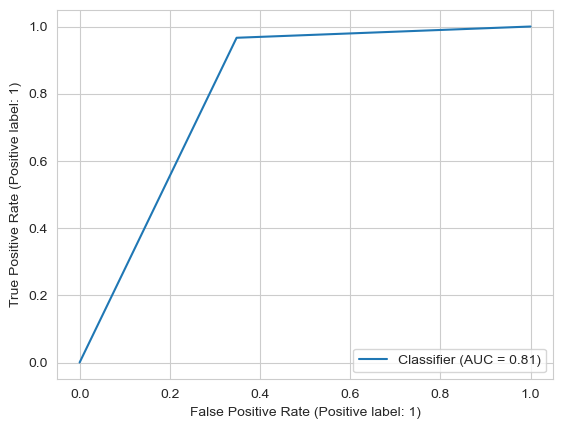

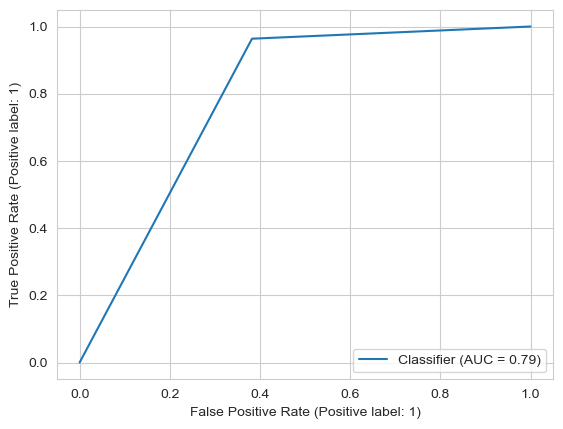

In [20]:
y_pred_test = clf.predict(X_test)
y_pred_train = clf.predict(X_train)

tree_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

The results look very promising - high values of **Accuracy**, **Precision**, **Recall** and **AUC** for the test set indicate that we managed to build a fairly good model. All the evaluation metrics are slightly higher for the train set than the test set, but the difference is small.  

Now, let's check if a tree based on the entropy criterion can beat this result:

In [21]:
clf = tree.DecisionTreeClassifier(criterion="entropy", max_depth=6)
clf = clf.fit(X_train,y_train)

In [22]:
features = data.columns.drop("class")

text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_8 <= 19.76
|   |--- feature_0 <= 118.00
|   |   |--- feature_8 <= 9.49
|   |   |   |--- feature_4 <= 0.24
|   |   |   |   |--- feature_6 <= -53.98
|   |   |   |   |   |--- feature_1 <= 37.12
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_1 >  37.12
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_6 >  -53.98
|   |   |   |   |   |--- feature_1 <= 59.25
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_1 >  59.25
|   |   |   |   |   |   |--- class: 0
|   |   |   |--- feature_4 >  0.24
|   |   |   |   |--- feature_2 <= 2.55
|   |   |   |   |   |--- feature_0 <= 17.92
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_0 >  17.92
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_2 >  2.55
|   |   |   |   |   |--- feature_3 <= 0.53
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_3 >  0.53
|   |   |   |   |   |   |--- class: 0
|   |   |--- feature_8 >  9.49
|

In [23]:
fig = plt.figure(figsize=(200,120))
_ = tree.plot_tree(clf, feature_names=features, filled=True, fontsize=20)

      Metric     Train      Test
0   Accuracy  0.854073  0.841047
1  Precision  0.849808  0.839350
2     Recall  0.942544  0.937122
3         F1  0.893777  0.885546

Confusion matrix - train:
[[3632 1641]
 [ 566 9285]]

Confusion matrix - train:
[[ 855  445]
 [ 156 2325]]

ROC train & ROC test:


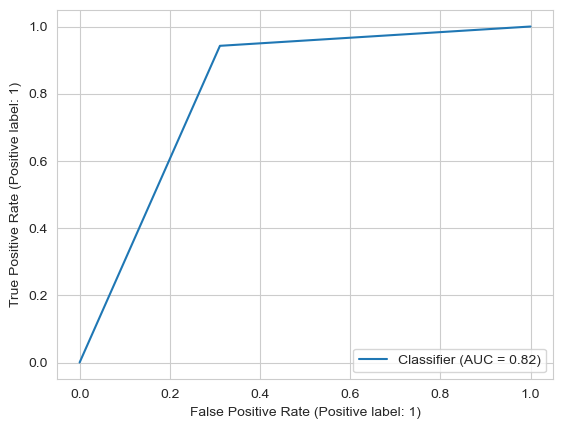

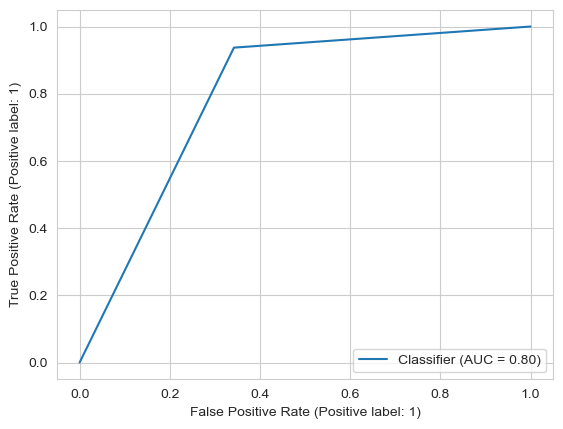

In [24]:
y_pred_test = clf.predict(X_test)
y_pred_train = clf.predict(X_train)

tree_ent_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

The difference between evaluation metrics for both models is very small - both models are good, but **the change of criterion from Gini to Entropy didn't improve the model's performance**. 

#### (b) Grid Search & Cross-Validation

Let's try and find the best hyperparameters of the decision tree using GridSearch and Cross-Validation:

In [25]:
tree_model = tree.DecisionTreeClassifier()
tree_model.fit(X_train, y_train)

parameters = {'criterion':["gini", "entropy"],
             "max_depth":range(1,10),
             "min_samples_split":range(1,10),
             "min_samples_leaf":range(1,5)}


grid = GridSearchCV(tree_model, 
                    param_grid = parameters, 
                    cv = 10, 
                    verbose=1, 
                    n_jobs =-1) 

grid.fit(X_train, y_train)
grid_search_tree = grid.best_estimator_

Fitting 10 folds for each of 648 candidates, totalling 6480 fits


Let's evaluate the model:

      Metric     Train      Test
0   Accuracy  0.888455  0.854800
1  Precision  0.882927  0.855670
2     Recall  0.955436  0.936719
3         F1  0.917751  0.894362

Confusion matrix - train:
[[4025 1248]
 [ 439 9412]]

Confusion matrix - train:
[[ 908  392]
 [ 157 2324]]

ROC train & ROC test:


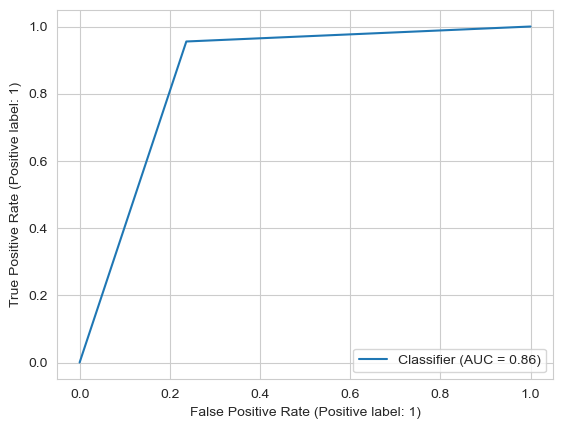

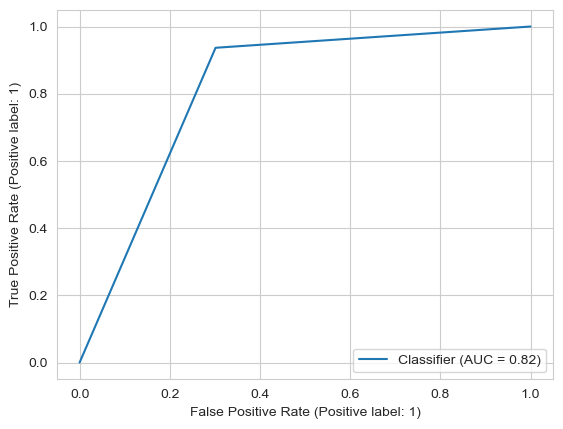

In [26]:
y_pred_test = grid_search_tree.predict(X_test)
y_pred_train = grid_search_tree.predict(X_train)

gs_tree_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

As we can see, the obtained model is better that both previous ones: all the evaluation metrics are higher. However, now the difference between values of metrics between train and test set is quite big.  
The best estimator was a decision tree based on Entropy critirion:

In [27]:
grid.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=4,
                       min_samples_split=3)

The `max_depth`=9 suggests that the tree is big and overfits a bit.

#### (c) Upsampling & Cross-Validation 

At the beginning we checked that the data is imbalanced. Let's handle this problem by running a Grid Search again, this time using the upsampling method. We also reduce the maximum possible value of `max_depth` to avoid the overfitting:

In [28]:
pipeline = Pipeline(steps=[('dec_tree',  tree.DecisionTreeClassifier())])

kf_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=21)

parameters = dict(dec_tree__criterion=["gini", "entropy"],
                  dec_tree__max_depth=range(3,8),
                  dec_tree__min_samples_split=range(1,10),
                  dec_tree__min_samples_leaf=range(1,5))

grid_search = GridSearchCV(estimator=pipeline,
                           param_grid=parameters,
                           verbose=1,
                           cv=kf_cv,
                           n_jobs=-1)

grid_search.fit(X_train, y_train)
grid_search_tree_upsampling = grid_search.best_estimator_

Fitting 10 folds for each of 360 candidates, totalling 3600 fits


Let's evaluate the model:

      Metric     Train      Test
0   Accuracy  0.867363  0.847395
1  Precision  0.868760  0.851811
2     Recall  0.938077  0.929061
3         F1  0.902089  0.888760

Confusion matrix - train:
[[3877 1396]
 [ 610 9241]]

Confusion matrix - train:
[[ 899  401]
 [ 176 2305]]

ROC train & ROC test:


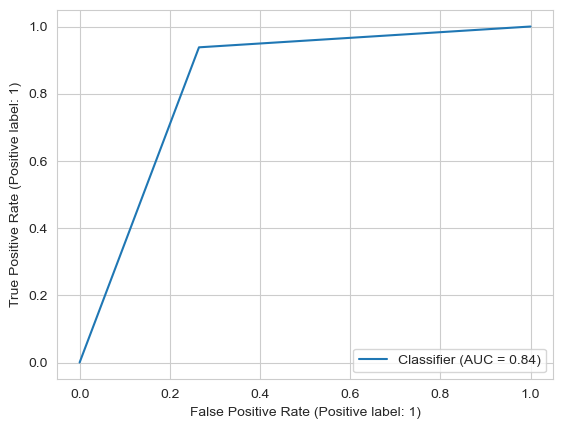

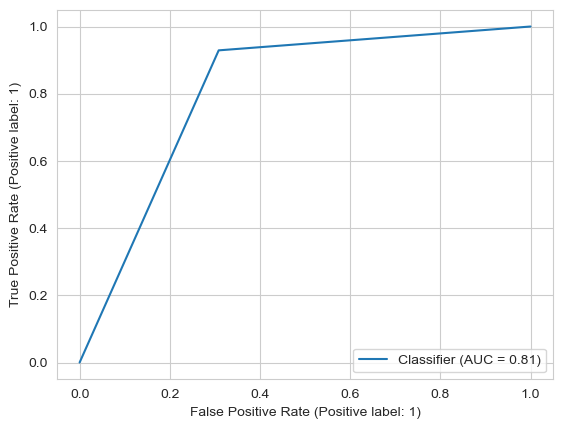

In [29]:
y_pred_test = grid_search_tree_upsampling.predict(X_test)
y_pred_train = grid_search_tree_upsampling.predict(X_train)

gs_up_tree_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

We managed to reduce the difference between the metrics on train and test set, and maintain their high values. Both models (with and without upsampling) are similar though.

Finally, the best Decision Tree Classifier can be obtained using parameters: `max_depth`=7, `min_samples_leaf`=2, `min_samples_split`=8.

In [30]:
grid_search.best_estimator_

Pipeline(steps=[('dec_tree',
                 DecisionTreeClassifier(max_depth=7, min_samples_leaf=3))])

### 2. Random Forest

The second model tested was the Random Forest Classifier. This model already samples observations (and features) and is complex; Cross-Validation is not needed in this case:

      Metric     Train      Test
0   Accuracy  0.857776  0.854271
1  Precision  0.839386  0.836237
2     Recall  0.966602  0.967352
3         F1  0.898514  0.897029

Confusion matrix - train:
[[3451 1822]
 [ 329 9522]]

Confusion matrix - train:
[[ 830  470]
 [  81 2400]]

ROC train & ROC test:


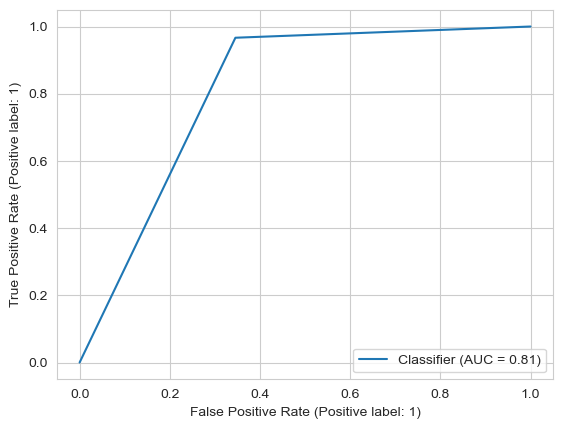

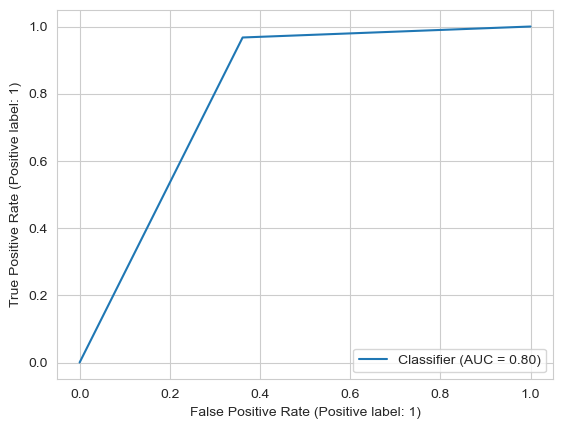

In [31]:
rnd_clf = RandomForestClassifier(n_estimators=500, max_depth=6)
rnd_clf.fit(X_train, y_train)

y_pred_test = rnd_clf.predict(X_test)
y_pred_train = rnd_clf.predict(X_train)

rf_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

The model's results are good: the values of metrics are high and the difference between their values on the train and test sets are small.

### 3. Support Vector Machine (SVM)

For the Support Vector Machine, classification was made with 5-Fold Cross-Validation to reduce number of observations with which the model is trained in each iteration (i.e. with many folds the algorithm would take a very long time to compute)

In [32]:
pipeline = Pipeline(steps=[('svc', SVC())])

kf_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=21)

parameters = dict(svc__kernel=["linear", "poly"])

grid_search = GridSearchCV(estimator=pipeline,
                           param_grid=parameters,
                           verbose=1,
                           cv=kf_cv,
                           n_jobs=-1)

grid_search.fit(X_train, y_train)
grid_search_svm = grid_search.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


Let's evaluate the model:

      Metric     Train      Test
0   Accuracy  0.816847  0.815393
1  Precision  0.797696  0.797266
2     Recall  0.963049  0.963724
3         F1  0.872609  0.872628

Confusion matrix - train:
[[2867 2406]
 [ 364 9487]]

Confusion matrix - train:
[[ 692  608]
 [  90 2391]]

ROC train & ROC test:


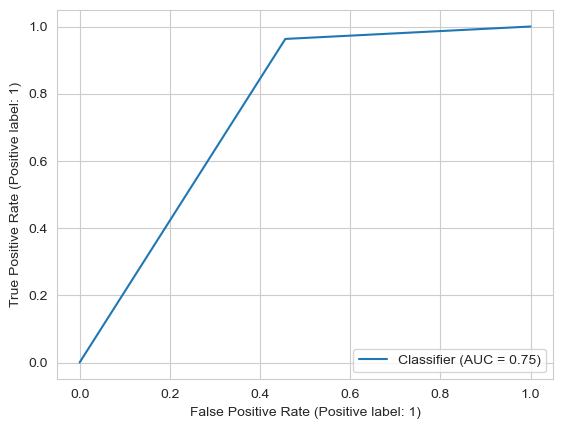

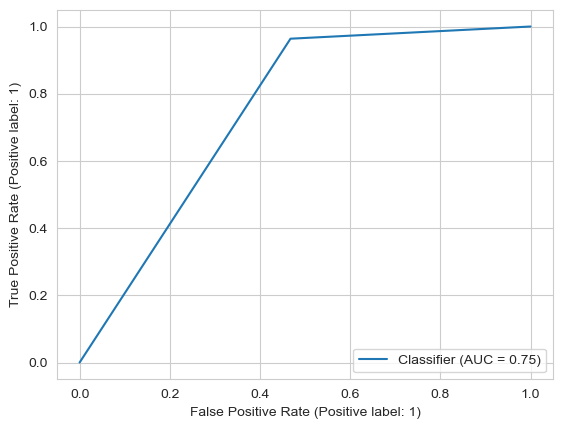

In [33]:
y_pred_test = grid_search_svm.predict(X_test)
y_pred_train = grid_search_svm.predict(X_train)

gs_svm_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

The values of evaluation metrics are very close for the train and test sets (good) but the results overall are poorer than the results of the previous models. The classifier with polynomial kernel performed better:

In [34]:
grid_search.best_estimator_

Pipeline(steps=[('svc', SVC(kernel='poly'))])

### 4. K-Nearest Neighbours (KNN)

The next model is a K-Nearest Neighbours model, estimated using Cross-Validation (with upsampling) and Grid Search used to find the optimal number of neighbours:

In [35]:
pipeline = Pipeline(steps=[('knn', KNeighborsClassifier())])

kf_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=21)

parameters = dict(knn__n_neighbors=range(5, 150, 2))

grid_search = GridSearchCV(estimator=pipeline,
                           param_grid=parameters,
                           verbose=1,
                           cv=kf_cv,
                           n_jobs=-1)

grid_search.fit(X_train, y_train)
grid_search_knn = grid_search.best_estimator_

Fitting 10 folds for each of 73 candidates, totalling 730 fits


Let's evaluate the model:

      Metric     Train      Test
0   Accuracy  0.827956  0.816980
1  Precision  0.810237  0.804978
2     Recall  0.960918  0.951632
3         F1  0.879168  0.872183

Confusion matrix - train:
[[3056 2217]
 [ 385 9466]]

Confusion matrix - train:
[[ 728  572]
 [ 120 2361]]

ROC train & ROC test:


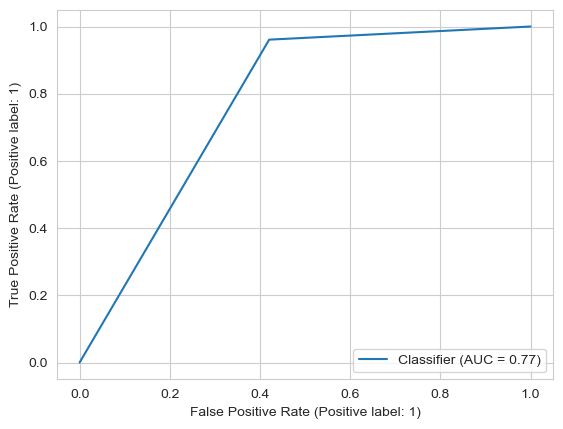

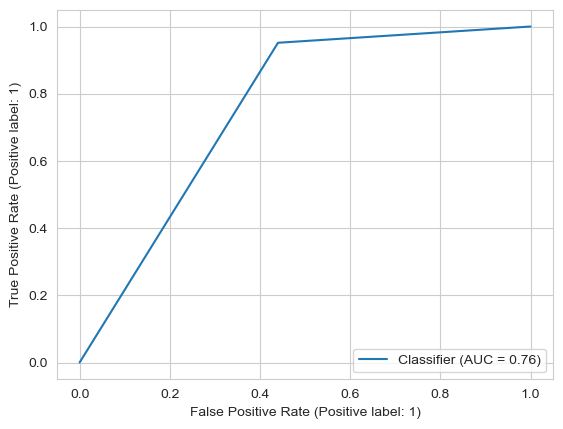

In [36]:
y_pred_test = grid_search_knn.predict(X_test)
y_pred_train = grid_search_knn.predict(X_train)

gs_knn_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

The model's results are much poorer than results of the previous models' (it outperformed only the SVM). The best classifier had 15 neighbours:

In [37]:
grid_search.best_estimator_

Pipeline(steps=[('knn', KNeighborsClassifier(n_neighbors=15))])

### 5. Neural Network

For neural network, the function was defined:

In [38]:
def create_ann():
    model = Sequential()
    model.add(Dense(units=64, activation='relu', kernel_initializer='random_normal', input_shape=(X_train.shape[1:])))
    model.add(Dense(units=1, activation='sigmoid', kernel_initializer='random_normal'))
    model.compile(optimizer ='adam',loss='binary_crossentropy', metrics =['accuracy'])
    return model

The variables were scaled:

In [39]:
mean = X_train.mean(axis=0)
std = X_train.std(axis=0)
X_train = (X_train - mean) / std
X_test = (X_test - mean) / std

And Grid Search was used to tune `batch_size` and `epochs`:

In [40]:
model = KerasClassifier(model=create_ann, verbose=0)

parameters = {'batch_size':[10,30,50],
            'epochs': [20,40,80,100,120,140]}


grid = GridSearchCV(estimator=model, 
                    param_grid=parameters,
                    cv=5,
                    n_jobs=-1)

grid.fit(X_train, y_train, verbose = 0)
grid_search_nn = grid.best_estimator_

The best estimator used the following parameters:

In [41]:
grid_search_nn

KerasClassifier(
	model=<function create_ann at 0x000001ECCA8033A0>
	build_fn=None
	warm_start=False
	random_state=None
	optimizer=rmsprop
	loss=None
	metrics=None
	batch_size=50
	validation_batch_size=None
	verbose=0
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=120
	class_weight=None
)

Let's evaluate the model:

      Metric     Train      Test
0   Accuracy  0.882306  0.869347
1  Precision  0.888066  0.877613
2     Recall  0.937468  0.930673
3         F1  0.912099  0.903365

Confusion matrix - train:
[[4109 1164]
 [ 616 9235]]

Confusion matrix - train:
[[ 978  322]
 [ 172 2309]]

ROC train & ROC test:


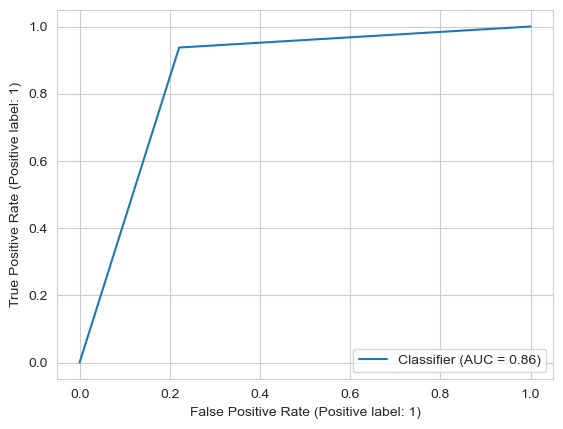

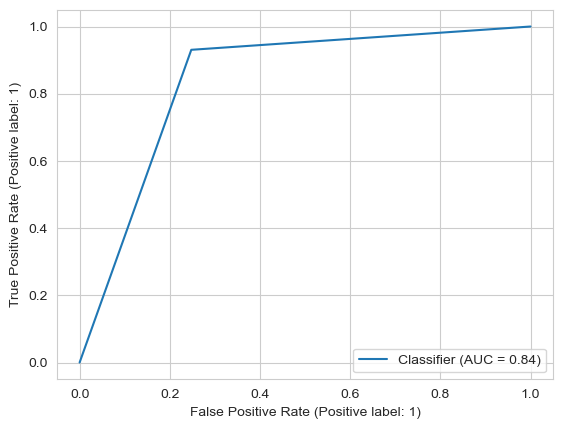

In [42]:
y_pred_train = grid_search_nn.predict(X_train)
y_pred_test = grid_search_nn.predict(X_test)

nn_eval = evaluate_model(y_train, y_pred_train, y_test, y_pred_test)

### Comparison of results 

In [45]:
comparison_df = pd.DataFrame()
comparison_df["Decision Tree - Gini"] = tree_eval
comparison_df["Decision Tree - Entropy"] = tree_ent_eval
comparison_df["Decision Tree - CV"] = gs_tree_eval
comparison_df["Decision Tree - CV + Upsampling"] = gs_up_tree_eval
comparison_df["Random Forest"] = rf_eval
comparison_df["Support Vector Machine"] = gs_svm_eval
comparison_df["K-Nearest-Neighbours"] = gs_knn_eval
comparison_df["Neural Network"] = nn_eval

comparison_df = comparison_df.transpose()
comparison_df = comparison_df.rename(columns = {0: "Accuracy train", 1: "Accuracy test", 2: "Precision train", 3: "Precision test", 4: "Recall train",
                                                5: "Recall test", 6: "F1 train", 7: "F1 test"})
comparison_df

,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test,F1 train,F1 test
Decision Tree - Gini,0.856784,0.844750,0.838338,0.827909,0.966501,0.963724,0.897869,0.890669
Decision Tree - Entropy,0.854073,0.841047,0.849808,0.839350,0.942544,0.937122,0.893777,0.885546
Decision Tree - CV,0.888455,0.854800,0.882927,0.855670,0.955436,0.936719,0.917751,0.894362
Decision Tree - CV + Upsampling,0.867363,0.847395,0.868760,0.851811,0.938077,0.929061,0.902089,0.888760
Random Forest,0.857776,0.854271,0.839386,0.836237,0.966602,0.967352,0.898514,0.897029
Support Vector Machine,0.816847,0.815393,0.797696,0.797266,0.963049,0.963724,0.872609,0.872628
K-Nearest-Neighbours,0.827956,0.816980,0.810237,0.804978,0.960918,0.951632,0.879168,0.872183
Neural Network,0.882306,0.869347,0.888066,0.877613,0.937468,0.930673,0.912099,0.903365


Overall, it seems like the best obtained classifier was the **Neural Network** (with a Decision Tree - CV not falling far behind), as for this classifier most of the metrics is the highest among all the models. However, this model's Recall metric low - assuming we are interested in finding Gamma particles specifically (we probably are) it might be more accurate to choose **Random Forest**, as its Recall is very high and the other metrics look good as well - on both train and test sets (plus, the difference between the metrics for train and test sets is very small, which suggests that **Random Forest might perform better when used for predictions on unseen data**).  